In [1]:
!nvidia-smi

Fri Mar 21 01:54:18 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 537.70                 Driver Version: 537.70       CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Quadro P6000                 WDDM  | 00000000:03:00.0  On |                 ERR! |
| 26%   32C    P8              16W / 250W |    822MiB / 24576MiB |     28%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
train_folder_path = r'C:\Users\U-III\Desktop\CMH\2025_IEEE_GRSS_Data_Fusion_Contest\Track1\dfc25_track1_trainval\train'

import os
import numpy as np
from PIL import Image
from torch.utils.data import Dataset
import os
import numpy as np
from PIL import Image
from torch.utils.data import Dataset
import torch

import albumentations as A
from albumentations.pytorch import ToTensorV2

def sar_piecewise_normalize(sar):
    """
    Given a single SAR image as a 2D NumPy array, first compute the mean value x_bar,
    then apply the piecewise formula:
        x_tilde = -1                  if x <= 0
                  1                   if x >= x_bar
                  2*x / x_bar - 1     otherwise
    """
    # Compute the mean per image
    x_bar = sar.mean()  # float
    
    # Convert to float32 for safety
    sar_out = sar.astype(np.float32)

    # Case 1: x <= 0
    neg_mask = sar_out <= 0
    sar_out[neg_mask] = -1

    # Case 2: x >= x_bar
    pos_mask = sar_out >= x_bar
    sar_out[pos_mask] = 1

    # Case 3: otherwise
    mid_mask = ~(neg_mask | pos_mask)
    # If x_bar == 0 (degenerate case), handle safely:
    if x_bar != 0:
        sar_out[mid_mask] = (2.0 * sar_out[mid_mask] / x_bar) - 1.0
    else:
        # If x_bar is 0, you might define an alternate fallback;
        # here we simply leave it as 0 in the mid_mask region.
        sar_out[mid_mask] = 0

    return sar_out

class SAR2RGBDataset(Dataset):
    def __init__(self, folder_path, transforms_rgb=None, transforms_sar=None):
        self.folder_path = folder_path
        self.transforms_rgb = transforms_rgb
        self.transforms_sar = transforms_sar
        self.sar_folder_path = os.path.join(folder_path, 'sar_images')
        self.rgb_folder_path = os.path.join(folder_path, 'rgb_images')
        self.sar_files = sorted(os.listdir(self.sar_folder_path))
        self.rgb_files = sorted(os.listdir(self.rgb_folder_path))
        
        # Cache for transformed tensors (final outputs)
        self.tensor_cache = {}
        
    def __len__(self):
        return len(self.sar_files)
    
    def __getitem__(self, idx):
        # Generate unique cache key for this index
        cache_key = idx
        
        # Check if the processed tensors are already in cache
        if cache_key in self.tensor_cache:
            return self.tensor_cache[cache_key]
        
        # If not in cache, process the images
        sar_path = os.path.join(self.sar_folder_path, self.sar_files[idx])
        rgb_path = os.path.join(self.rgb_folder_path, self.rgb_files[idx])
        
        # Read SAR and apply piecewise normalization
        sar = np.array(Image.open(sar_path))
        # Apply transforms to SAR
        if self.transforms_sar:
            transformed = self.transforms_sar(image=sar)
            sar = transformed['image']
        else:
            # Convert SAR to tensor if no transforms
            sar = torch.from_numpy(sar[None, ...]).float()  # shape (1, H, W)
        sar = sar_piecewise_normalize(sar.squeeze().numpy())  # mapped to [-1, 1]
        sar = torch.from_numpy(sar).unsqueeze(0).float()

        # Read RGB image
        rgb = np.array(Image.open(rgb_path))
        
        # Apply transforms to RGB
        if self.transforms_rgb:
            transformed = self.transforms_rgb(image=rgb)
            rgb = transformed['image']
        else:
            # Minimal fallback: convert to float tensor [0..1]
            rgb = torch.from_numpy(rgb.transpose(2, 0, 1)).float() / 255.0
        
        
        # Store the processed tensors in cache
        self.tensor_cache[cache_key] = {
            "sar": sar,
            "rgb": rgb
        }
        
        return self.tensor_cache[cache_key]

(4333, 1083)

In [ ]:
size = (512, 512)
train_transforms_rgb = A.Compose([
    A.Resize(*size, interpolation=Image.NEAREST),
    A.Normalize(mean=(0.5, 0.5, 0.5), 
                std=(0.5, 0.5, 0.5)),  # -> [-1,1]
    ToTensorV2()
])

train_transforms_sar = A.Compose([
    A.Resize(*size, interpolation=Image.NEAREST),
    ToTensorV2()
])

def denormalize_rgb(rgb):
    # shape: (3, 512, 512)
    return rgb * torch.tensor([0.5, 0.5, 0.5]).view(3, 1, 1) + torch.tensor([0.5, 0.5, 0.5]).view(3, 1, 1)

# Create the dataset
train_dataset = SAR2RGBDataset(
    folder_path=train_folder_path,
    transforms_rgb=train_transforms_rgb,
    transforms_sar=train_transforms_sar
)

BATCH_SIZE = 4
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)
train_dataloader = train_loader

len(train_dataset), len(train_loader)

In [15]:
a = next(iter(train_dataloader))

a["sar"].shape, a["rgb"].shape, a["sar"].repeat(1, 3, 1, 1).shape, a["rgb"].min(), a["rgb"].max(), a["sar"].min(), a["sar"].max()

(torch.Size([4, 1, 512, 512]),
 torch.Size([4, 3, 512, 512]),
 torch.Size([4, 3, 512, 512]),
 tensor(-0.9529),
 tensor(0.9922),
 tensor(-1.),
 tensor(1.))

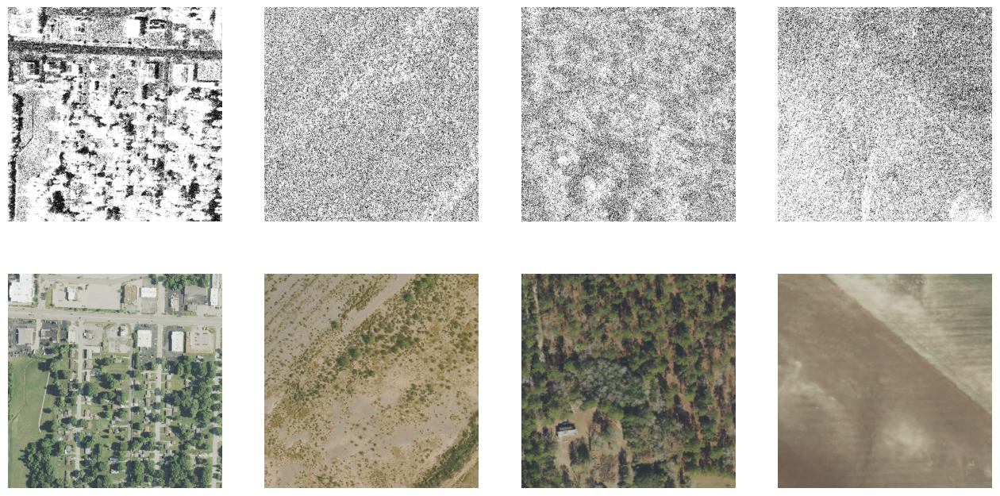

In [17]:
# Visualize the first batch
import matplotlib.pyplot as plt

sar, rgb = a["sar"], a["rgb"]
fig, axes = plt.subplots(2, BATCH_SIZE, figsize=(16, 8))
for i in range(BATCH_SIZE):
    axes[0, i].imshow(sar[i].squeeze(), cmap='gray')
    axes[0, i].axis('off')
    axes[1, i].imshow(denormalize_rgb(rgb[i].squeeze().cpu()).permute(1, 2, 0))
    axes[1, i].axis('off')

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from diffusers import ControlNetModel, StableDiffusionControlNetPipeline, UniPCMultistepScheduler, DDPMScheduler
from diffusers.optimization import get_scheduler
from tqdm.auto import tqdm
from torchvision.utils import make_grid, save_image
import os
from PIL import Image

# Check device
device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Print CUDA device info if available
if device.type == 'cuda':
    if torch.cuda.is_available():
        print(f"CUDA Device: {torch.cuda.get_device_name(0)}")
        print(f"CUDA Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

config = {
    "pretrained_model_name": "runwayml/stable-diffusion-v1-5",
    "controlnet_model_name": "lllyasviel/sd-controlnet-canny", # Better for edge detection which might work well with SAR
    "learning_rate": 1e-5,
    "train_batch_size": 4,
    "num_epochs": 20,
    "gradient_accumulation_steps": 2,
    "seed": 42,
    "save_model_epochs": 5,
    "save_images_epochs": 1,
    "output_dir": "./sar2rgb_controlnet_v5",
    "prompt": "satellite image of terrain, high resolution",
    "negative_prompt": "blurry, low quality, distorted",
    "num_inference_steps": 20,
    "guidance_scale": 7.5,
}

# Set random seeds for reproducibility
torch.manual_seed(config["seed"])
np.random.seed(config["seed"])

# Create output directory
os.makedirs(config["output_dir"], exist_ok=True)
os.makedirs(os.path.join(config["output_dir"], "samples"), exist_ok=True)
os.makedirs(os.path.join(config["output_dir"], "checkpoints"), exist_ok=True)


In [19]:
config

{'pretrained_model_name': 'runwayml/stable-diffusion-v1-5',
 'controlnet_model_name': 'lllyasviel/sd-controlnet-canny',
 'learning_rate': 1e-05,
 'train_batch_size': 4,
 'num_epochs': 20,
 'gradient_accumulation_steps': 2,
 'seed': 42,
 'save_model_epochs': 5,
 'save_images_epochs': 1,
 'output_dir': './sar2rgb_controlnet_v5',
 'prompt': 'satellite image of terrain, high resolution',
 'negative_prompt': 'blurry, low quality, distorted',
 'num_inference_steps': 20,
 'guidance_scale': 7.5}

In [ ]:
# Load models
print("Loading models...")
controlnet = ControlNetModel.from_pretrained(
    config["controlnet_model_name"],
    torch_dtype=torch.float32  # Use full precision
).to(device)

# Load the pipeline with the controlnet
pipeline = StableDiffusionControlNetPipeline.from_pretrained(
    config["pretrained_model_name"],
    controlnet=controlnet,
    safety_checker=None,
    torch_dtype=torch.float32  # Use full precision
).to(device)

# Use a more efficient scheduler for inference
pipeline.scheduler = UniPCMultistepScheduler.from_config(pipeline.scheduler.config)

# Set up training scheduler
noise_scheduler = DDPMScheduler.from_config(pipeline.scheduler.config)

# Freeze other models except ControlNet
pipeline.vae.requires_grad_(False)
pipeline.text_encoder.requires_grad_(False)
pipeline.unet.requires_grad_(False)
controlnet.train()

# Optimizer
optimizer = torch.optim.AdamW(
    controlnet.parameters(),
    lr=config["learning_rate"],
    betas=(0.9, 0.999),
    weight_decay=1e-2,
    eps=1e-8,
)

# Learning rate scheduler
lr_scheduler = get_scheduler(
    "cosine",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=len(train_dataloader) * config["num_epochs"] // config["gradient_accumulation_steps"],
)


In [ ]:
# Define loss function
def compute_loss(noise_pred, noise_target):
    """Compute MSE loss between predicted and target noise"""
    return F.mse_loss(noise_pred, noise_target)

# Function for tensor to image conversion for visualization
def tensor_to_image(tensor, is_normalized=True):
    """Convert a tensor [-1,1] to a numpy image [0,255]"""
    if is_normalized:
        tensor = (tensor + 1) / 2.0  # [-1,1] -> [0,1]
    tensor = tensor.clamp(0, 1)
    
    if len(tensor.shape) == 4:  # Batch of images
        tensor = tensor[0]  # Take the first image in the batch
        
    # Convert to numpy and transpose to HWC format
    array = tensor.cpu().detach().numpy().transpose(1, 2, 0)
    
    # Handle grayscale images
    if array.shape[2] == 1:
        array = array.squeeze(2)
        return (array * 255).astype(np.uint8)
    else:
        return (array * 255).astype(np.uint8)

# Function to visualize results
def visualize_results(sar_images, real_rgb_images, generated_images, epoch, batch_idx=0):
    """Visualize the SAR input, real RGB, and generated RGB images"""
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    
    for i in range(min(4, len(sar_images))):
        # SAR image (single channel)
        sar_img = tensor_to_image(sar_images[i])
        axes[0, i].imshow(sar_img, cmap='gray')
        axes[0, i].set_title(f"SAR Input {i+1}")
        axes[0, i].axis('off')
        
        # Real RGB image
        real_rgb = tensor_to_image(real_rgb_images[i])
        axes[1, i].imshow(real_rgb)
        axes[1, i].set_title(f"Real RGB {i+1}")
        axes[1, i].axis('off')
        
        # Generated RGB image
        gen_rgb = tensor_to_image(generated_images[i])
        axes[2, i].imshow(gen_rgb)
        axes[2, i].set_title(f"Generated RGB {i+1}")
        axes[2, i].axis('off')
    
    plt.tight_layout()
    save_path = os.path.join(config["output_dir"], "samples", f"epoch_{epoch}_batch_{batch_idx}.png")
    plt.savefig(save_path)
    plt.close()
    
    return save_path

# Function to generate images using the pipeline
@torch.no_grad()
def generate_images(sar_images, batch_size=4):
    """Generate RGB images from SAR inputs using the current pipeline"""
    # Need to convert single channel SAR to 3-channel for ControlNet input
    sar_3ch = sar_images.repeat(1, 3, 1, 1)
    
    # Scale from [-1,1] to [0,1] for pipeline input
    sar_3ch = (sar_3ch + 1) / 2.0
    
    # Generate images using pipeline with proper error handling
    try:
        # Standard precision inference
        outputs = pipeline(
            [config["prompt"]] * batch_size,
            negative_prompt=[config["negative_prompt"]] * batch_size,
            image=sar_3ch,  # ControlNet conditioning image
            num_inference_steps=config["num_inference_steps"],
            guidance_scale=config["guidance_scale"],
            output_type="pt"  # Return tensors instead of PIL images
        )
        
        # Convert outputs to tensors scaled to [-1,1] to match RGB range
        generated_images = outputs.images * 2.0 - 1.0  # [0,1] -> [-1,1]
    except Exception as e:
        print(f"Error in image generation: {e}")
        import traceback
        traceback.print_exc()
        # In case of error, return black images as placeholder
        generated_images = torch.ones_like(sar_images.repeat(1, 3, 1, 1)) * -1
    
    return generated_images


In [ ]:
# Display some initial generated examples
controlnet.eval()

# Get a batch of validation data
val_batch = next(iter(train_dataloader))  # Using training data for visualization
sar_val = val_batch["sar"].to(device)
rgb_val = val_batch["rgb"].to(device)

# Generate images
gen_images = generate_images(sar_val, batch_size=len(sar_val))

# Visualize results
vis_path = visualize_results(sar_val, rgb_val, gen_images, 0)
print(f"Visualization saved to {vis_path} at the start of training")

controlnet.train()

# Training loop
global_step = 0
for epoch in range(config["num_epochs"]):
    progress_bar = tqdm(total=len(train_dataloader), disable=False)
    progress_bar.set_description(f"Epoch {epoch+1}")
    
    epoch_loss = 0.0
    for step, batch in enumerate(train_dataloader):
        # Get SAR and RGB images
        sar_images = batch["sar"].to(device)  # Shape: [B, 1, H, W]
        rgb_images = batch["rgb"].to(device)  # Shape: [B, 3, H, W]
        
        # Check for NaN values
        if torch.isnan(sar_images).any() or torch.isnan(rgb_images).any():
            print(f"Warning: NaN values detected in input batch {step}. Skipping...")
            continue
            
        # Print shapes for debugging first batch
        if epoch == 0 and step == 0:
            print(f"SAR shape: {sar_images.shape}, RGB shape: {rgb_images.shape}")
            print(f"SAR range: [{sar_images.min().item():.2f}, {sar_images.max().item():.2f}]")
            print(f"RGB range: [{rgb_images.min().item():.2f}, {rgb_images.max().item():.2f}]")
        
        # Convert single-channel SAR to 3-channel for ControlNet
        sar_3ch = sar_images.repeat(1, 3, 1, 1)  # Shape: [B, 3, H, W]
        
        # Get text embeddings for the prompt
        prompts = [config["prompt"]] * sar_images.shape[0]
        text_inputs = pipeline.tokenizer(
            prompts,
            padding="max_length",
            max_length=pipeline.tokenizer.model_max_length,
            truncation=True,
            return_tensors="pt",
        ).to(device)
        text_embeddings = pipeline.text_encoder(text_inputs.input_ids)[0]
        
        # Get target latents by encoding the real RGB images
        with torch.no_grad():
            latents = pipeline.vae.encode(rgb_images).latent_dist.sample()
            latents = latents * pipeline.vae.config.scaling_factor
        
        # Sample noise and add it to latents
        noise = torch.randn_like(latents)
        timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (sar_images.shape[0],), device=device)
        noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)
        
        down_block_res_samples, mid_block_res_sample = controlnet(
            noisy_latents,
            timesteps,
            encoder_hidden_states=text_embeddings,
            controlnet_cond=sar_3ch,
            return_dict=False,
        )
    
        # Print debugging info for first batch
        if epoch == 0 and step == 0:
            print(f"Number of down block samples: {len(down_block_res_samples)}")
            for i, sample in enumerate(down_block_res_samples):
                print(f"Down block sample {i} shape: {sample.shape}")
            print(f"Mid block sample shape: {mid_block_res_sample.shape}")
        
        # Use UNet with the conditioning from ControlNet
        model_pred = pipeline.unet(
            noisy_latents,
            timesteps,
            encoder_hidden_states=text_embeddings,
            down_block_additional_residuals=down_block_res_samples,
            mid_block_additional_residual=mid_block_res_sample,
            return_dict=False,
        )[0]
        
        # Calculate loss
        loss = compute_loss(model_pred, noise)
        
        # Divide loss by gradient accumulation steps
        loss = loss / config["gradient_accumulation_steps"]
                
        
        # Standard precision training
        loss.backward()
        
        if (step + 1) % config["gradient_accumulation_steps"] == 0:
            # Clip gradients
            torch.nn.utils.clip_grad_norm_(controlnet.parameters(), 1.0)
            
            # Update weights
            optimizer.step()
            
            # Update learning rate
            lr_scheduler.step()
            
            # Zero gradients
            optimizer.zero_grad(set_to_none=True)
            
            # Increment global step
            global_step += 1
        
        epoch_loss += loss.detach().item() * config["gradient_accumulation_steps"]
        
        logs = {"loss": loss.detach().item(), "lr": lr_scheduler.get_last_lr()[0]}
        progress_bar.update(1)
        progress_bar.set_postfix(**logs)
        
    # Log average epoch loss
    avg_epoch_loss = epoch_loss / len(train_dataloader)
    print(f"Epoch {epoch+1} average loss: {avg_epoch_loss:.4f}")
    
    # Generate and visualize sample images at the end of each epoch
    if (epoch+1) % config["save_images_epochs"] == 0:
        controlnet.eval()
        
        # Generate images
        gen_images = generate_images(sar_val, batch_size=len(sar_val))
        
        # Visualize results
        vis_path = visualize_results(sar_val, rgb_val, gen_images, epoch+1)
        print(f"Visualization saved to {vis_path} at the end of epoch {epoch+1}")
        
        controlnet.train()
        
    # Save model checkpoint
    if (epoch+1) % config["save_model_epochs"] == 0:
        save_path = os.path.join(config["output_dir"], "checkpoints", f"controlnet_epoch_{epoch+1}.pt")
        torch.save(controlnet.state_dict(), save_path)
        print(f"Model saved to {save_path}")

In [ ]:
# Save final model
final_save_path = os.path.join(config["output_dir"], "controlnet_final_v5.pt")
torch.save(controlnet.state_dict(), final_save_path)
print(f"Final model saved to {final_save_path}")

# Save the entire pipeline for inference
pipeline.save_pretrained(os.path.join(config["output_dir"], "full_pipeline"))
print(f"Full pipeline saved to {os.path.join(config['output_dir'], 'full_pipeline')}")

# Display some final generated examples
print("Generating final examples...")
controlnet.eval()

# Get a batch of test data
test_batch = next(iter(train_dataloader))
sar_test = test_batch["sar"].to(device)
rgb_test = test_batch["rgb"].to(device)

# Generate images
gen_images = generate_images(sar_test, batch_size=len(sar_test))

# Visualize final results
final_vis_path = visualize_results(sar_test, rgb_test, gen_images, "final")
print(f"Final visualization saved to {final_vis_path}")

print("Training complete!")

In [22]:
config

{'pretrained_model_name': 'runwayml/stable-diffusion-v1-5',
 'controlnet_model_name': 'lllyasviel/sd-controlnet-canny',
 'learning_rate': 1e-05,
 'train_batch_size': 4,
 'num_epochs': 20,
 'gradient_accumulation_steps': 2,
 'seed': 42,
 'save_model_epochs': 5,
 'save_images_epochs': 1,
 'output_dir': './sar2rgb_controlnet_v5',
 'prompt': 'satellite image of terrain, high resolution',
 'negative_prompt': 'blurry, low quality, distorted',
 'num_inference_steps': 20,
 'guidance_scale': 7.5}

In [ ]:
print("Generating final examples...")
controlnet.eval()

# Get a batch of test data
test_batch = next(iter(train_dataloader))
sar_test = test_batch["sar"].to(device)
rgb_test = test_batch["rgb"].to(device)

# Generate images
gen_images = generate_images(sar_test, batch_size=len(sar_test))

# Visualize final results
final_vis_path = visualize_results(sar_test, rgb_test, gen_images, "final")
print(f"Final visualization saved to {final_vis_path}")

print("Training complete!")

  0%|          | 0/20 [00:00<?, ?it/s]

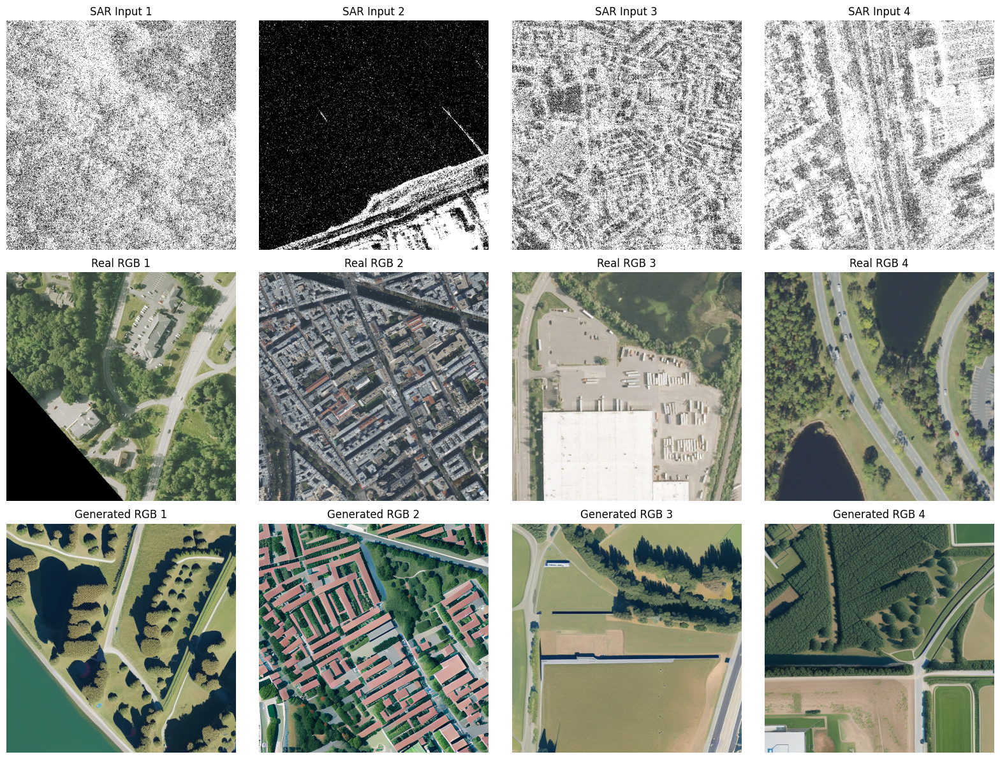

In [27]:
config["guidance_scale"]=10.0

# Generate images
generated_images = generate_images(sar_test, batch_size=len(sar_test))

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    
for i in range(min(4, len(sar_images))):
    # SAR image (single channel)
    sar_img = tensor_to_image(sar_images[i])
    axes[0, i].imshow(sar_img, cmap='gray')
    axes[0, i].set_title(f"SAR Input {i+1}")
    axes[0, i].axis('off')
    
    # Real RGB image
    real_rgb = tensor_to_image(rgb_test[i])
    axes[1, i].imshow(real_rgb)
    axes[1, i].set_title(f"Real RGB {i+1}")
    axes[1, i].axis('off')
    
    # Generated RGB image
    gen_rgb = tensor_to_image(generated_images[i])
    axes[2, i].imshow(gen_rgb)
    axes[2, i].set_title(f"Generated RGB {i+1}")
    axes[2, i].axis('off')

plt.tight_layout()
plt.show()


  0%|          | 0/20 [00:00<?, ?it/s]

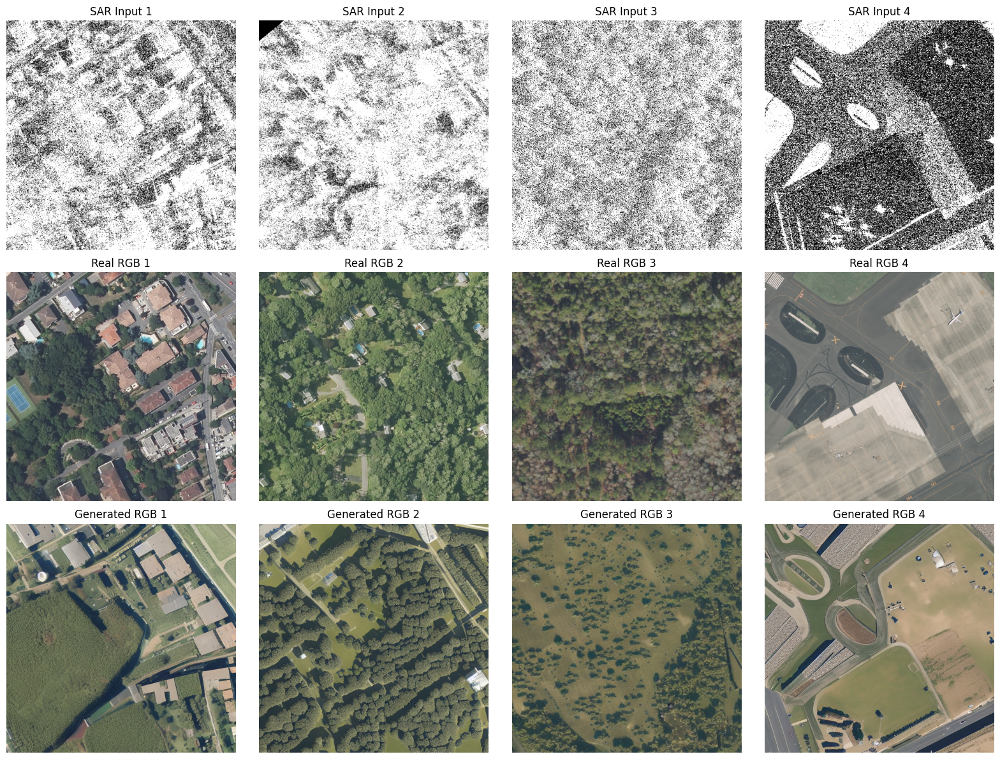

In [36]:
controlnet.eval()
config["guidance_scale"]=5.0

# Generate images
generated_images = generate_images(sar_test, batch_size=len(sar_test))

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    
for i in range(min(4, len(sar_test))):
    # SAR image (single channel)
    sar_img = tensor_to_image(sar_test[i])
    axes[0, i].imshow(sar_img, cmap='gray')
    axes[0, i].set_title(f"SAR Input {i+1}")
    axes[0, i].axis('off')
    
    # Real RGB image
    real_rgb = tensor_to_image(rgb_test[i])
    axes[1, i].imshow(real_rgb)
    axes[1, i].set_title(f"Real RGB {i+1}")
    axes[1, i].axis('off')
    
    # Generated RGB image
    gen_rgb = tensor_to_image(generated_images[i])
    axes[2, i].imshow(gen_rgb)
    axes[2, i].set_title(f"Generated RGB {i+1}")
    axes[2, i].axis('off')

plt.tight_layout()
plt.show()


  0%|          | 0/20 [00:00<?, ?it/s]

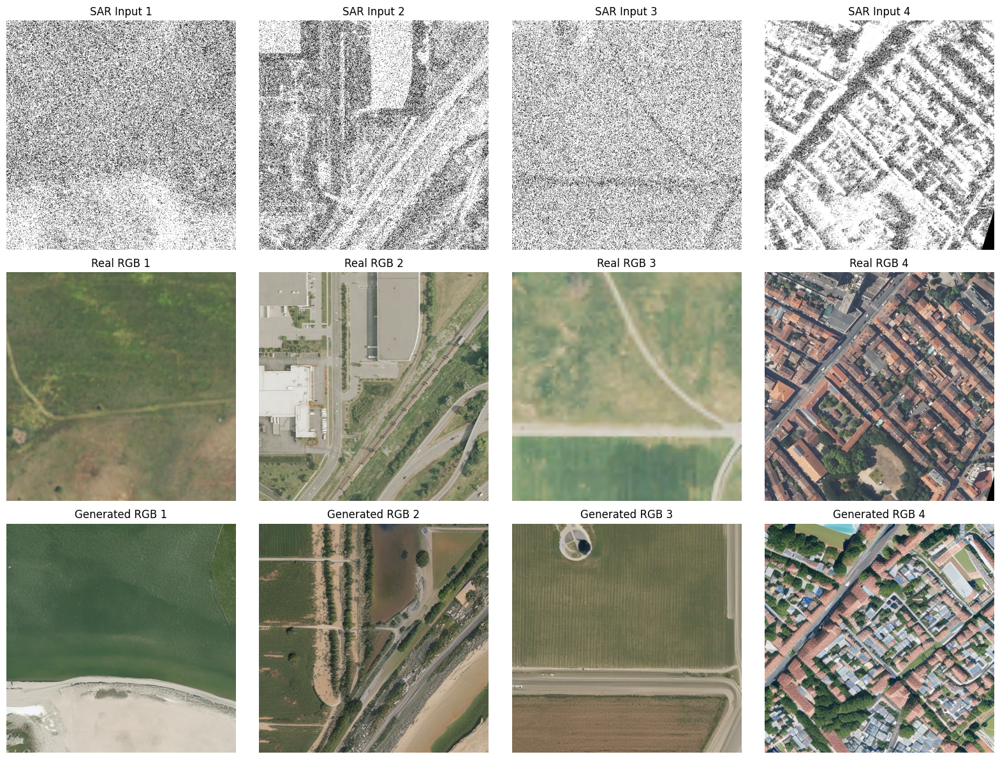

In [37]:
controlnet.eval()
config["guidance_scale"]=5.0
# Get a batch of test data
test_batch = next(iter(train_dataloader))
sar_test = test_batch["sar"].to(device)
rgb_test = test_batch["rgb"].to(device)

# Generate images
generated_images = generate_images(sar_test, batch_size=len(sar_test))

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    
for i in range(min(4, len(sar_test))):
    # SAR image (single channel)
    sar_img = tensor_to_image(sar_test[i])
    axes[0, i].imshow(sar_img, cmap='gray')
    axes[0, i].set_title(f"SAR Input {i+1}")
    axes[0, i].axis('off')
    
    # Real RGB image
    real_rgb = tensor_to_image(rgb_test[i])
    axes[1, i].imshow(real_rgb)
    axes[1, i].set_title(f"Real RGB {i+1}")
    axes[1, i].axis('off')
    
    # Generated RGB image
    gen_rgb = tensor_to_image(generated_images[i])
    axes[2, i].imshow(gen_rgb)
    axes[2, i].set_title(f"Generated RGB {i+1}")
    axes[2, i].axis('off')

plt.tight_layout()
plt.show()
